In [ ]:
import numpy as np
import pandas as pd

# End-To-End Multi-class Dog Breed Classifier

### 1. problem

Identifying the breeds of a dog given an image of dog.

### 2. Data

The data we're using is from kaggle's Dig Breed Identification 

### 3. Evalution

The evaluation is file with predciton probabilities for each dog breed of each test image.

### 4. Feature 
Some informationabout the data : 
* We're dealung with images (unstuctructured data) so it's probably best we use deep learning or transfer learning.
* There are 120 breeds of Dogs (120 different classes)
* There are around 10000+ images in training (with labels) and 10000+ images in test set (without labels), because we want to predict them.


### Get our workspace ready

* import Tensorflow
* Import TensorFlow Hub
* Use a GPU


In [ ]:
# import tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
print("TF version", tf.__version__)
print("TF version", hub.__version__)

TF version 2.7.0
TF version 0.12.0


In [ ]:
# Check for GPU availability
print("GPU","available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YESS!!!!)


## Getting our data (turning into tensor)
Data has to be conveerted into numerical format thus convert the data into tensors. Lets start by accessing our data and checking out the labels.

In [ ]:
# Checkout the lables of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Project Data/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     a4a278e6cbadb8c0b65d808d0ba0e3cf  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


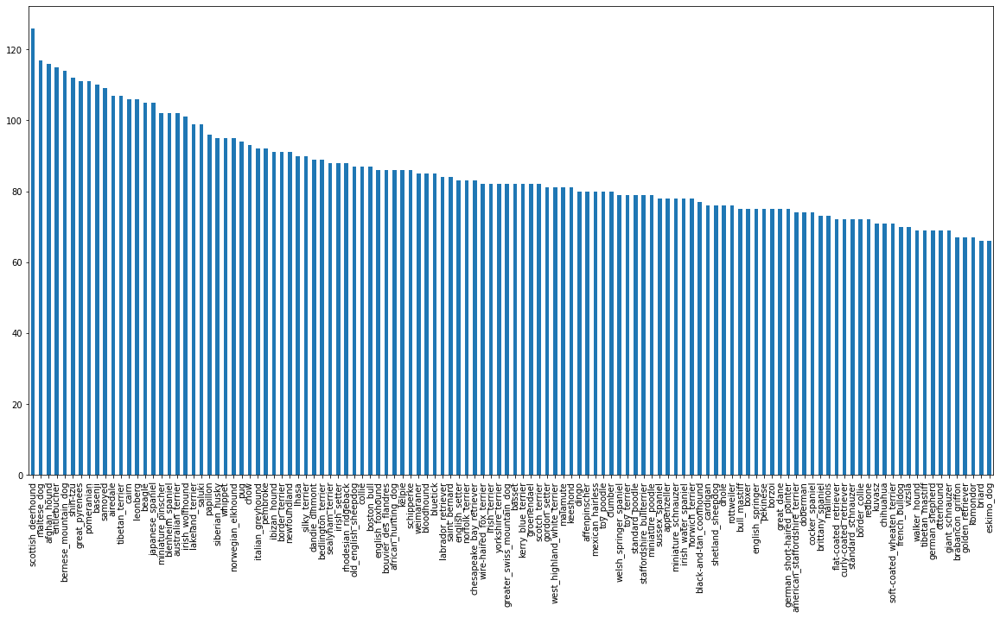

In [ ]:
# How many images are there for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

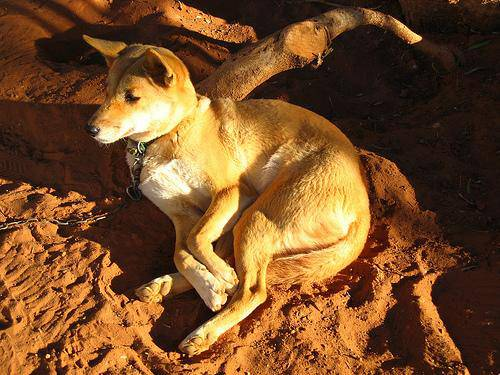

In [ ]:
# Letsveiw an image
from IPython.display import Image
Image("drive/MyDrive/Project Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our images file pathnames

In [ ]:
# create pathnames from images ID's
filename = ["drive/MyDrive/Project Data/train/" + fname for fname in labels_csv["id"] + ".jpg"]

filename[:10]

['drive/MyDrive/Project Data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Project Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Project Data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Project Data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Project Data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Project Data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Project Data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Project Data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Project Data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Project Data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual images
import os
if len(os.listdir("drive/MyDrive/Project Data/train/")) == len(filename):
  print("Filenames match actual numbers of images that we imported and unzipped")
else:
  print("filenames do not match the actual number of images")

Filenames match actual numbers of images that we imported and unzipped


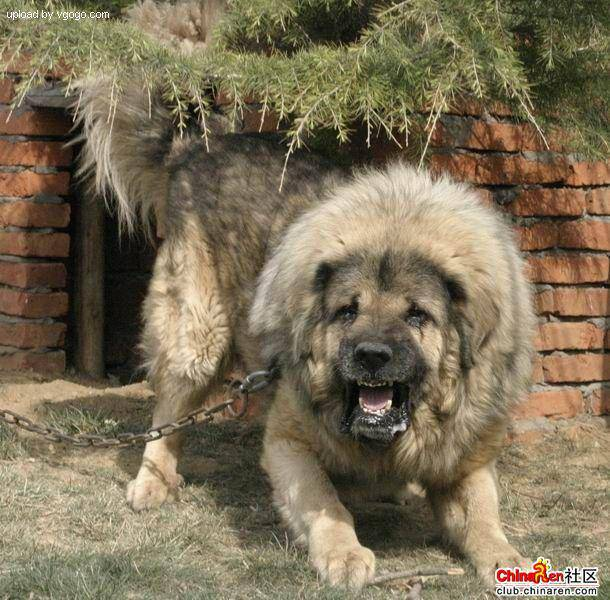

In [ ]:
#one more check
Image(filename[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got out training image file paths in a list,  let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the numeber of filenames
if len(labels) == len (filename) : 
  print("Number of labels same as number of filenames")
else : 
  print("Number of labels does not match of filenames, chek data directories!")

Number of labels same as number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning booleans array into integers
print(labels[0])
print(np.where(unique_breeds ==labels[0]))
print(boolean_labels[0].astype(int))


boston_bull
(array([19]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filename[:10]

['drive/MyDrive/Project Data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Project Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Project Data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Project Data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Project Data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Project Data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Project Data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Project Data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Project Data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Project Data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own data

since the data set doesnt come with kaggle

In [ ]:
# Setup X & Y variables
x = filename
y = boolean_labels

We're going to start off on experimenting on 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

from sklearn.model_selection import train_test_split
#split them into training and validation of total size NUM_Images
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(y_train), len(x_val), len(y_val)                  

(800, 800, 200, 200)

In [ ]:
# Let's have a go at training data
x_train[:5],y_train[:2]

(['drive/MyDrive/Project Data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Project Data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Project Data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Project Data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Project Data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, Fals

## Preprocessing images : Turning images into Tensors

to preprocess our images into tensors we will write a function which does a few things:
1. Take an image file as input 
2. Use Tensorflow to read the file and save it to a variable 'image'
3. Turn our 'image' (a jpg) into tensors
4. convert colour channel values from 0-255 to 0-1 values, normalization. 
5. Resizethe 'image' to be a shape of (224, 224)
6. return the modified image

Before we do that, lets see what importing an image looks like

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
image.max(), image.min()

(255, 0)

Now we have seen what an image looks like in a Tensors, let's make afunction to preprocess them.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  # Read in an image file
  image = tf.io.read_file(image_path)

  #Turn JPEG into numeric Tensor with 3 colour channels (R, G, B)
  image = tf.image.decode_jpeg(image, channels=3)

  # Conert the colour channel values from 0 to 255 to 0-1 values, normalization
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value ( 224, 224 )
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches

Why turn our data into batches?

batches : collection of 32 images

Let's say you're trying to process images in one go, they all might not fit into the memory.

so thats why we do 32 images at a time.

In order to use tensorflow effictively, we need our data in the form of Tensor Tupples which looks like this: (image, label).

In [ ]:
# create a simple function to return a tupple of tensors
def get_image_label(image_path, label):
  """
  takes an image file path and labels associated woth it, processes it and returns the tuple of(image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuple of Tensors in the form of(image, label), let's make a function to turn all of our data into batches!


In [ ]:
# Define the batch size, 32
BATCH_SIZE = 32

# create a function to turn data into labels
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image x and label y pairs.
  it shuffles the data if it's traing but doesnt shuffle if its validation data.
  Also accepts test data as imputs (no Labels)
  """
  #If the data is a test data set, we don't have labels
  if test_data:
    print("Creating test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only file path (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)  
    return data_batch

   # if the data is a valid dataset, we do not need to shuffle it
  elif valid_data:
    print("creating validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y))) #filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

  else:
    print("Creating training data batches..")
    #turn file paths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))

    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
     
    # create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map((get_image_label))

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# create training and valid data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches..
creating validation data batches..


In [ ]:
# check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches

our data is in baches however it is hard understand and comprehend,let's visualise them.

In [ ]:
import matplotlib.pyplot as plt 

# create a function to view images in a data betch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # setup the figure
  plt.figure(figsize=(10, 10))
  # Loop trhough 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

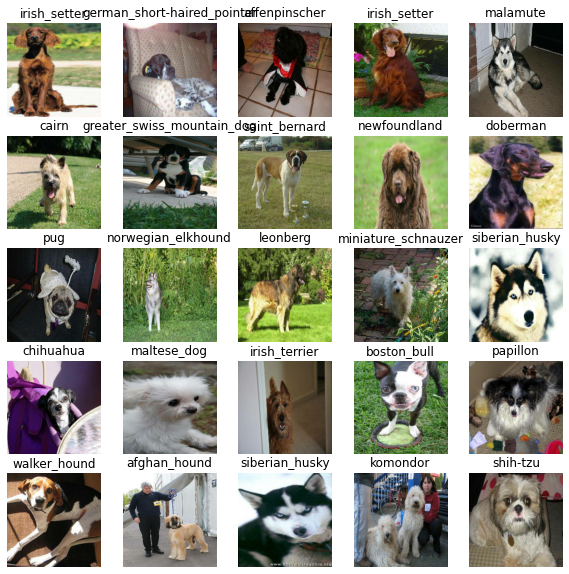

In [ ]:
# Now lets visualise the data in the training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

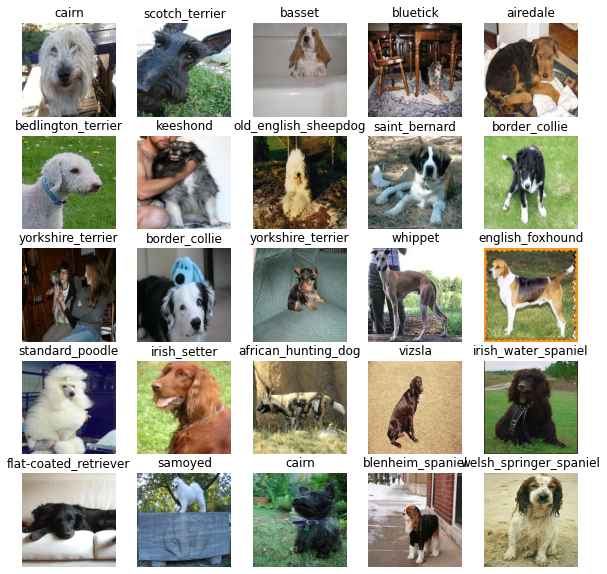

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define 
* The input shape (our images in the shape of tensors) to or model.
* The output shape (image lables, in the form of tensors) of our model.
* The URL of model we wanna use

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

# Setup output shape of oue model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from tensorflow HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"


Now we.ve got inputs, outputs and model ready, lets put it in keras dl model api

knowing this let's create a function which:
* Takes the input, output shape and model as the params.
* Defines the layers in keras model in sequantial fashion ( do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it will be getting)
* Returns the model

all of these steps can be found here : https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(model_url), # layer 1 (input layer)
                               tf.keras.layers.Dense(units=output_shape,
                                                     activation="softmax"), # layer 2 (output layer)
                               ])
  
  # compile the model
  model.compile(
      loss=tf.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(input_shape)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1664)              3766048   
                                                                 
 dense (Dense)               (None, 120)               199800    
                                                                 
Total params: 3,965,848
Trainable params: 199,800
Non-trainable params: 3,766,048
_________________________________________________________________


# Creating callbacks

Callbacks are helpere functions a model can use during training to do things such as save it's progress, check it's progress or stop training if a model stops improving.

we'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents ou model from training for too long.

### TensorBoard callbacks

to setup a tensorboard call backs we need to do three things
* Load tensorboard extension
* Create a TenosrBoard callback which is able to save logs to a directory and pass it to our model's fit function.
* Visualise our model's training logs with the '%tensorboard' magic function (we'll do this after model training) 


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# create a function to build a TensorBoard call back
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Project Data/logs",
                        # Make it so the logs are tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Helps stop our model from overfitting by stopping training if a certain evaluation metric stops to improve

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Train a model

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [ ]:
# check to make sure we're still on GPU
print("GPU", "available(Yess)"if tf.config.list_physical_devices("GPU")else "not available")

GPU available(Yess)


Let's create a function that trains a model:

* create a model using 'create_model()'
* Setup a Tensorboard callback using 'create_tensorboard_callback()'
* Call the 'fit()' function on our model passing it the training data, validation data, number of epochs to train for 'NUM_EPOCHS' and the callbacks we'd like to use
* Return the model




In [ ]:
# build a function to train and return the trained model
def train_model():
  """
  Trains a given model and reurns the trained model
  """
  # create a model
  model = create_model()

  # create new TesnorBoard session everytime we train our model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit (x=train_data,
             epochs=NUM_EPOCHS,
             validation_data=val_data,
             validation_freq=1,
             callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Epoch 1/100
25/25 [==============================] - 186s 3s/step - loss: 4.2717 - accuracy: 0.1462 - val_loss: 3.1533 - val_accuracy: 0.3500
Epoch 2/100
25/25 [==============================] - 5s 185ms/step - loss: 1.4316 - accuracy: 0.7900 - val_loss: 1.8427 - val_accuracy: 0.6250
Epoch 3/100
25/25 [==============================] - 5s 191ms/step - loss: 0.5283 - accuracy: 0.9550 - val_loss: 1.4332 - val_accuracy: 0.6550
Epoch 4/100
25/25 [==============================] - 5s 194ms/step - loss: 0.2646 - accuracy: 0.9862 - val_loss: 1.2839 - val_accuracy: 0.7050
Epoch 5/100
25/25 [==============================] - 5s 191ms/step - loss: 0.1669 - accuracy: 0.9962 - val_loss: 1.2304 - val_accuracy: 0.7000
Epoch 6/100
25/25 [==============================] - 5s 193ms/step - loss: 0.1176 - accuracy: 0.9987 - val_loss: 1.2035 - val_accuracy: 0.7050
Epoch 7/100
25/25 [==============================]

## Ways to prevent model overfitting in deep learning neural networks

###  Checking the TesnorBoard logs

the TensorBoard magic function `tensorboard` will access the logs we created earlier and visulise its contents.


In [ ]:
%tensorboard --logdir drive/MyDrive/Project\ Data/logs

Output hidden; open in https://colab.research.google.com to view.

# Making and Evaluating prediction using a trained model

In [ ]:
# Make predictions on validation data (not used to train)
prediction = model.predict(val_data,verbose=1)
prediction

7/7 [==============================] - 2s 161ms/step


array([[6.4266555e-04, 5.1136984e-05, 4.5830742e-04, ..., 1.9301648e-05,
        1.9325831e-05, 3.0108562e-03],
       [2.4423236e-03, 6.3589861e-05, 9.6719991e-03, ..., 8.9841807e-05,
        9.4775832e-04, 3.3935914e-05],
       [1.5334974e-05, 1.8315665e-04, 7.6369543e-05, ..., 7.1039179e-04,
        5.0993345e-05, 6.0936779e-04],
       ...,
       [6.3102502e-06, 2.5262889e-05, 1.5440487e-04, ..., 9.5716905e-06,
        7.1426359e-05, 1.7333573e-04],
       [2.1604537e-03, 4.1639338e-05, 1.3908175e-04, ..., 9.7080738e-05,
        7.3211297e-05, 5.4752207e-03],
       [2.8577761e-04, 5.5963797e-06, 6.2683327e-03, ..., 3.2852597e-03,
        4.5010762e-04, 1.7501536e-04]], dtype=float32)

In [ ]:
prediction.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
len(prediction[0])

120

In [ ]:
np.sum(prediction[0])

1.0000001

In [ ]:
np.sum(prediction[1])

1.0

In [ ]:
# first prediction
index=42
print(prediction[index])
print(f"Max value (probability of prediction):{np.max(prediction[0])}")
print(f"Sum: {np.sum(prediction[index])}")
print(f"Max index: {np.argmax(prediction[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(prediction[index])]}")


[4.5418547e-05 9.7975411e-05 2.5933445e-04 2.0297812e-05 2.0339580e-03
 6.4449057e-05 1.3202956e-04 6.8147290e-03 7.2307386e-02 6.4925022e-02
 8.3170271e-06 4.4776403e-05 2.3495728e-04 6.7409188e-03 1.7016516e-03
 3.4672450e-03 1.6327132e-05 2.1712907e-04 3.9714156e-04 3.0677306e-04
 5.8301471e-06 8.2075992e-04 2.2508291e-05 1.6209948e-05 1.3554132e-02
 3.1343505e-05 2.6167545e-06 2.5638010e-04 4.4835097e-04 1.6677968e-05
 1.6307462e-05 1.0412791e-04 8.2554099e-05 5.7584912e-05 6.5790091e-06
 6.0341536e-06 5.6263347e-05 3.9655456e-04 2.8280090e-05 2.3328069e-01
 2.5104533e-04 1.2650209e-05 1.9465431e-03 4.4015728e-06 3.7740192e-05
 3.3313769e-05 9.5346149e-05 6.8378914e-04 1.7251585e-05 7.1635004e-04
 7.9356985e-05 1.9194905e-04 3.5347132e-04 1.7293440e-03 3.2098182e-05
 5.3523609e-04 9.3577459e-05 3.8590657e-05 1.6062220e-05 1.0022387e-04
 9.9444871e-05 1.6094337e-04 1.7351987e-05 5.8751757e-05 1.2386712e-05
 1.9512918e-05 1.6167385e-05 2.8037891e-04 1.5845995e-04 8.7099788e-06
 8.170

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is good but we want to to do it at scale

And it would be even better if we could see the image the is being made on

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilites into their respective labels
def get_pred_labels(prediction_probabilities):
  """
  Turns an array of prediction probabilities into labels
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_labels(prediction[82])
pred_label

'pekinese'

Since our val_data is in batches, we have to unbatch it to make prediction on validation images and then compare those prediction to validation labels (truth labels)

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate 
  arrays of images and labels
  """
  images = []
  labels = []
  # loop through batched data 
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data 
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction Labels
* Validation Labels (truth labels)
* Validation images

Lets's make some function to make these all a bit more visualizing.

We'll create a function which:
* takes an array of prediction probabilities, an array of truth labels and an array of images and integer(s).
* convert prediction probabilites to a predicted label.
* plot predicted label, its predicted probability, the truth labels and the taret image on single plot

In [ ]:
def plot_pred (prediction_probabilities, labels, images, n=1):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_labels(pred_prob)

  # Plot image and removal ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depenedning on if the prediction is right or wrong

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be predicted label, probability of prediction and truth label.
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

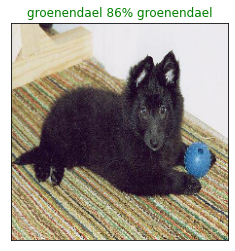

In [ ]:
plot_pred(prediction_probabilities=prediction,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction. lets make another to view our models top 10 prediction

This function will:
* Take an input of preediction probabilities array and a ground truth array and an Integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes 
  * Prediction probabilities values
  * Prediction labels
* Plot top 10 prediction probability values and labels, colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels,n=1):
  """
  plot the top 10 highets prediction confidences along with the truth label for sample n.
  """
  pred_prob, truth_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_labels(pred_prob)

  # Find the toip 10 prediction cofidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup_plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change the color of true label
  if np.isin(truth_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == truth_label)].set_color("green")
  else:
    pass

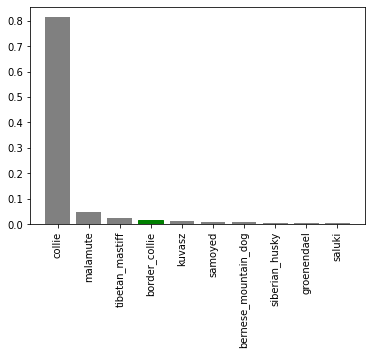

In [ ]:
plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=9)


Now we've got some function to help us visualise our prediction and evaluate our model, let's check out a few.


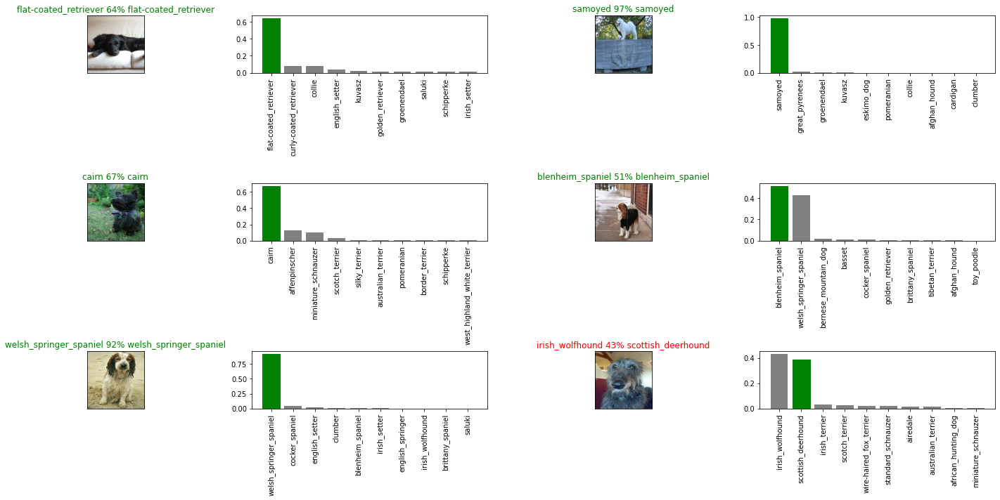

In [ ]:
# Lets check out few prediction and there different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_cols))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels = val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=prediction,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

**Challange** Create a confusion matrix with our models prediction and true labels?

# Saving and reloading a trained model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in models directory and appends a suffix (string).
  """
  # Create model directory pathname woth current time
  modeldir = os.path.join("drive/My Drive/Project Data/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"saving model to: {model_path}")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a saved model
def load_model (model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  
  return model

Now we've got the functions to save and load the model now lets test them

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-adam")

saving model to: drive/My Drive/Project Data/Models/20220105-15331641396793-1000-images-mobilenetv2-adam.h5


'drive/My Drive/Project Data/Models/20220105-15331641396793-1000-images-mobilenetv2-adam.h5'

In [ ]:
# Load a trained model
Loaded_1000_images_model = load_model("drive/My Drive/Project Data/Models/20220104-17461641318371-1000-images-mobilenetv2-adam.h5")

Loading saved model from: drive/My Drive/Project Data/Models/20220104-17461641318371-1000-images-mobilenetv2-adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 119ms/step - loss: 1.0520 - accuracy: 0.7350


[1.0519516468048096, 0.7350000143051147]

In [ ]:
# Evaluate the loaded model
Loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 2s 127ms/step - loss: 1.1000 - accuracy: 0.7100


[1.1000043153762817, 0.7099999785423279]

## Training on complete dataset

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# create a data batch with full data set
full_data = create_data_batches(x, y)

Creating training data batches..


In [ ]:
full_data, len(full_data)

(<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>,
 320)

In [ ]:
# create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note** : Running below cell will take more time eta 30 mins

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 51s 146ms/step - loss: 1.2658 - accuracy: 0.6902
Epoch 2/100
320/320 [==============================] - 67s 208ms/step - loss: 0.3800 - accuracy: 0.8924
Epoch 3/100
320/320 [==============================] - 69s 216ms/step - loss: 0.2248 - accuracy: 0.9442
Epoch 4/100
320/320 [==============================] - 70s 219ms/step - loss: 0.1436 - accuracy: 0.9723
Epoch 5/100
320/320 [==============================] - 72s 226ms/step - loss: 0.0969 - accuracy: 0.9856
Epoch 6/100
320/320 [==============================] - 90s 281ms/step - loss: 0.0689 - accuracy: 0.9932
Epoch 7/100
320/320 [==============================] - 54s 170ms/step - loss: 0.0522 - accuracy: 0.9959
Epoch 8/100
320/320 [==============================] - 68s 211ms/step - loss: 0.0401 - accuracy: 0.9976
Epoch 9/100
320/320 [==============================] - 87s 271ms/step - loss: 0.0314 - accuracy: 0.9982
Epoch 10/100
320/320 [==============================] - 64s 200m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

saving model to: drive/My Drive/Project Data/Models/20220105-15571641398228-full-image-set-mobilenetv2-Adam.h5


'drive/My Drive/Project Data/Models/20220105-15571641398228-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load inthe full model
full_model=load_model("drive/My Drive/Project Data/Models/20220104-18291641320983-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Project Data/Models/20220104-18291641320983-full-image-set-mobilenetv2-Adam.h5


## Making prediction on test dataset

 Since our model has been trained on the form of Tensor batches, to make predictions on the test data, we'll have to get it in same format

luckilly we created cretae_data_batches function

to make prediction on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data soesn't have laebls).
* Make predictions array by passing the test batches to the `predict()` method called on our model.



In [ ]:
# Load test images filenames
test_path = "drive/MyDrive/Project Data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Project Data/test/e42e9ceb31ec428968e88b556a92e858.jpg',
 'drive/MyDrive/Project Data/test/ddbdd621e79563a56443a0dd1ee4c48d.jpg',
 'drive/MyDrive/Project Data/test/e3a43510b5f90bfb9fb050c77cabb079.jpg',
 'drive/MyDrive/Project Data/test/dcd6ca546a353654a136431e6fa70972.jpg',
 'drive/MyDrive/Project Data/test/e79030be9c9769f3604474aea16039bd.jpg',
 'drive/MyDrive/Project Data/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 'drive/MyDrive/Project Data/test/dd6ef59cad61882fec54f4b6a429065e.jpg',
 'drive/MyDrive/Project Data/test/deb063345bf2b6752e2fe25cad096547.jpg',
 'drive/MyDrive/Project Data/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 'drive/MyDrive/Project Data/test/e1bc331d2667664376a50f7ff627ec5d.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**NOTE** calling predict on our full model will take a long time to run

In [ ]:
# make prediction on test data batch using full loaded model
test_prediction = full_model.predict(test_data,
                                     verbose=1)

324/324 [==============================] - 202s 602ms/step


In [ ]:
np.savetxt("drive/My Drive/Project Data/preds_array.csv", test_prediction, delimiter=",")


In [ ]:
test_prediction = np.loadtxt("drive/My Drive/Project Data/preds_array.csv", delimiter = ",")

In [ ]:
test_prediction[:10]

array([[2.95948297e-08, 5.61443447e-10, 8.35442577e-08, ...,
        2.45364296e-04, 1.88760574e-12, 2.25746621e-09],
       [1.08986733e-07, 1.31589717e-08, 1.38737548e-07, ...,
        4.34763603e-09, 3.69442081e-11, 1.78943554e-10],
       [2.31126208e-07, 3.31143575e-08, 1.46102806e-07, ...,
        1.49279404e-05, 3.23192523e-07, 7.76952014e-09],
       ...,
       [2.22729955e-06, 4.75756212e-10, 8.09855649e-09, ...,
        2.06545864e-10, 5.79963512e-07, 4.88640762e-06],
       [2.27408364e-07, 6.53924961e-12, 5.70496006e-09, ...,
        8.06448297e-10, 2.18248093e-11, 3.19248461e-10],
       [2.30757519e-06, 1.37708000e-07, 2.33765363e-07, ...,
        4.48779616e-07, 4.28849080e-06, 8.86886264e-05]])

In [ ]:
test_prediction.shape

(10357, 120)

## Preparing test data set prediction for submission on kaggle
Looking at the kaggle sample submission, we find it wants our models prediction probability outputs in a dataframe with an ID and column for each dog breed.

To get the data in this format, we'll, 
* Create a pandas DataFrame with an ID column as well as a column for each dog breed 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to kaggle


In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:

# create a pandas dataframe
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test image ids to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_prediction
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e42e9ceb31ec428968e88b556a92e858,2.95948e-08,5.61443e-10,8.35443e-08,3.96275e-08,3.55753e-05,9.86766e-06,7.00587e-10,1.28262e-08,4.37943e-08,2.03241e-08,3.55049e-09,1.00601e-12,3.1225e-06,1.35504e-10,1.34742e-08,2.09498e-05,1.68711e-08,5.71028e-10,3.45694e-09,1.94307e-07,1.71433e-07,2.38235e-10,3.95714e-06,4.37014e-10,4.41618e-10,2.1677e-08,3.12879e-10,1.91275e-08,1.43433e-05,6.37967e-06,1.31368e-10,8.51342e-11,2.05788e-08,2.5326e-05,0.000423336,5.92245e-14,5.04771e-10,6.02041e-08,1.38453e-06,...,7.02945e-08,5.50436e-12,5.26951e-11,4.82881e-13,1.1342e-12,3.12481e-09,2.4048e-12,1.15059e-07,0.00238429,1.28288e-05,1.2242e-05,2.6945e-07,1.02422e-10,3.36845e-07,8.08521e-09,0.000388838,5.15078e-08,1.96361e-05,4.02252e-10,4.83489e-10,9.83726e-08,4.92874e-09,2.49108e-09,2.78554e-08,0.0345216,9.4221e-07,2.91461e-10,3.06937e-08,4.31883e-06,1.63549e-08,8.7009e-07,4.4056e-08,7.19004e-05,2.3112e-09,0.000981282,2.40167e-10,5.30917e-09,0.000245364,1.88761e-12,2.25747e-09
1,ddbdd621e79563a56443a0dd1ee4c48d,1.08987e-07,1.3159e-08,1.38738e-07,5.68464e-08,6.75344e-09,6.71529e-09,2.36555e-09,1.95452e-09,1.13628e-10,5.45126e-10,5.21732e-10,1.17385e-07,1.75805e-10,4.05907e-10,2.23306e-09,1.07927e-09,2.8439e-06,3.58191e-10,4.12103e-08,2.22129e-08,1.04322e-06,8.85162e-09,2.06419e-07,2.27508e-07,6.04688e-10,1.86305e-08,2.34717e-08,1.17803e-08,1.41135e-07,3.94581e-09,0.877837,4.15803e-09,1.42433e-08,2.73216e-05,9.70927e-10,1.38877e-08,1.67296e-08,7.56354e-10,1.46559e-09,...,5.01608e-07,1.87952e-06,3.676e-08,8.91007e-10,1.21709e-10,9.78611e-07,5.38846e-09,0.00265122,1.09855e-06,1.22554e-08,1.91857e-08,2.10516e-10,4.97578e-09,6.63885e-11,0.000394467,4.28149e-05,7.25501e-08,1.20172e-06,1.02022e-10,1.62202e-05,4.95785e-10,1.71814e-08,8.68339e-10,3.91915e-10,6.82345e-07,5.23906e-05,4.38727e-11,3.87263e-08,0.00327451,8.83947e-09,1.44787e-07,6.44399e-10,7.87703e-09,2.59932e-11,8.16292e-07,1.09501e-10,1.09892e-08,4.34764e-09,3.69442e-11,1.78944e-10
2,e3a43510b5f90bfb9fb050c77cabb079,2.31126e-07,3.31144e-08,1.46103e-07,2.13242e-08,7.96889e-07,0.000180941,1.6621e-09,4.27752e-07,3.29023e-08,1.43835e-07,2.95737e-08,0.000148281,8.77467e-11,3.24053e-06,3.63947e-10,9.09065e-07,0.50946,5.7373e-09,7.37417e-05,7.83019e-06,8.36157e-10,1.18466e-10,2.93536e-09,1.12327e-06,6.65157e-07,3.69901e-10,8.04312e-09,0.0260835,2.08838e-08,2.69701e-07,8.63316e-09,2.28583e-08,1.39355e-06,0.448089,6.20213e-08,2.4102e-07,2.671e-08,1.12535e-09,2.73405e-10,...,2.61917e-08,2.37492e-07,0.000264567,1.02889e-09,6.94015e-06,4.37563e-07,7.86107e-06,1.1319e-07,4.04587e-08,2.61409e-07,2.12938e-08,2.42173e-10,0.000651778,1.00745e-08,0.000116689,3.17169e-06,2.60559e-08,8.85219e-07,8.68022e-07,0.00818756,9.65272e-06,0.000250472,4.15335e-08,4.99785e-09,5.17936e-07,1.02633e-05,2.57596e-08,2.18341e-08,1.54005e-06,0.000200962,1.12232e-06,1.09897e-06,1.85803e-08,8.94788e-08,2.74317e-09,9.23273e-07,6.87756e-06,1.492

In [ ]:
preds_df.to_csv("drive/My Drive/Project Data/full_model_predictions__submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make prediction on custom images, we'll:
* Get the filepaths of our own Image
* Turn the filepaths into data batches using `create_data_batches()`. And since our current images won't have labels, we set the `test_data` param to true.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the predicted output probabilites to prediction labels
* compare the predicted labels to the custom images 


In [ ]:
# Get custom image filepath
custom_path = "drive/My Drive/Project Data/My-Dog-Photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Project Data/My-Dog-Photos/funny-dog-captions-1563456605.jpg',
 'drive/My Drive/Project Data/My-Dog-Photos/dog-puppy-on-garden-royalty-free-image-1586966191.jpg',
 'drive/My Drive/Project Data/My-Dog-Photos/download.jfif']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on custom data
custom_preds = full_model.predict(custom_data)
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_labels(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
# Get custom images (unbatchify wanotwork as there are'nt any custom labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

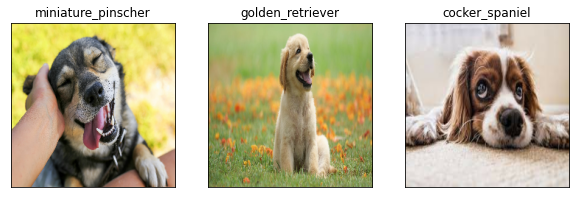

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)